In [3]:
import warnings
warnings.simplefilter("ignore")
from mpl_toolkits.axes_grid1 import ImageGrid
import matplotlib.pyplot as plt
import pandas as pd
import random
import shutil
import umap
import numpy as np
import os

# Own libraries
import sys
main_path = '/mnt/cephfs/sharedscratch/users/fshahi/Projects/Histomorphological-Phenotype-Learning'
sys.path.append(main_path)
from data_manipulation.data import Data
from data_manipulation.utils import store_data
from models.evaluation.folds import load_existing_split
from models.clustering.data_processing import *


2023-09-28 09:48:53.387961: I tensorflow/stream_executor/platform/default/dso_loader.cc:50] Successfully opened dynamic library libcudart.so.12


## Data to deal with

In [27]:
folds_pickle = '{}/files/pkl_Meso_400_subsampled_he_complete.pkl'.format(main_path)

dataset        = 'Meso_400_subsampled'
meta_field     = 'os_event_ind'
rep_key        = 'z_latent'
matching_field = 'slides'
fold_number    = 4
resolution     = 5.0
groupby        = 'leiden_%s' % resolution

h5_additional_path   = '{}/results/BarlowTwins_3/TCGA_MESO/h224_w224_n3_zdim128/hdf5_TCGA_MESO_he_combined_metadata.h5'.format(main_path)
h5_complete_path = '{}/results/BarlowTwins_3/Meso_400_subsampled/h224_w224_n3_zdim128/hdf5_Meso_400_subsampled_he_complete_combined_metadata.h5'.format(main_path)
adatas_path        = '{}/results/BarlowTwins_3/Meso_400_subsampled/h224_w224_n3_zdim128/meso_subtypes_nn400/adatas'.format(main_path)
adata_name         = h5_complete_path.split('/hdf5_')[1].split('.h5')[0] + '_%s__fold%s' % (groupby.replace('.', 'p'), fold_number)

indexes_remove_path = '{}/files/indexes_to_remove'.format(main_path)
data_remove_path    = os.path.join(indexes_remove_path, dataset)
if not os.path.isdir(data_remove_path):
    os.makedirs(data_remove_path)


### Dataset Images

In [5]:
data = Data(dataset=dataset, marker='he', patch_h=224, patch_w=224, n_channels=3, batch_size=64, project_path=main_path, load=True)

--------------------------------------
Train Set: /mnt/cephfs/sharedscratch/users/fshahi/Projects/Histomorphological-Phenotype-Learning/datasets/Meso_400_subsampled/he/patches_h224_w224/hdf5_Meso_400_subsampled_he_train.h5
--------------------------------------
Validation Set: /mnt/cephfs/sharedscratch/users/fshahi/Projects/Histomorphological-Phenotype-Learning/datasets/Meso_400_subsampled/he/patches_h224_w224/hdf5_Meso_400_subsampled_he_validation.h5
--------------------------------------
Test Set: /mnt/cephfs/sharedscratch/users/fshahi/Projects/Histomorphological-Phenotype-Learning/datasets/Meso_400_subsampled/he/patches_h224_w224/hdf5_Meso_400_subsampled_he_test.h5
----------------------------------------------------------------------------------


### Folds

### Representations, fold, and set frames.

In [28]:
complete_frame,   complete_dims,   complete_rest   = representations_to_frame(h5_complete_path,   meta_field=meta_field, rep_key=rep_key, check_meta=True)
if h5_additional_path is not None:
    additional_frame, additional_dims, additional_rest = representations_to_frame(h5_additional_path, meta_field=meta_field, rep_key=rep_key)

Loading representations: /mnt/cephfs/sharedscratch/users/fshahi/Projects/Histomorphological-Phenotype-Learning/results/BarlowTwins_3/Meso_400_subsampled/h224_w224_n3_zdim128/hdf5_Meso_400_subsampled_he_complete_combined_metadata.h5
Loading representations: /mnt/cephfs/sharedscratch/users/fshahi/Projects/Histomorphological-Phenotype-Learning/results/BarlowTwins_3/TCGA_MESO/h224_w224_n3_zdim128/hdf5_TCGA_MESO_he_combined_metadata.h5


In [29]:
# Get folds from existing split.
folds = load_existing_split(folds_pickle)
dataframes, complete_df, leiden_clusters = read_csvs(adatas_path, matching_field, groupby, fold_number, folds[fold_number], h5_complete_path, h5_additional_path, force_fold=fold_number)
additional_df = dataframes[-1]
np.shape(dataframes)


Adata name: Meso_400_subsampled_he_complete_combined_metadata_leiden_5p0__fold4
Train csv not found: /mnt/cephfs/sharedscratch/users/fshahi/Projects/Histomorphological-Phenotype-Learning/results/BarlowTwins_3/Meso_400_subsampled/h224_w224_n3_zdim128/meso_subtypes_nn400/adatas/Meso_400_subsampled_he_complete_combined_metadata_leiden_5p0__fold4_train.csv
Train csv: /mnt/cephfs/sharedscratch/users/fshahi/Projects/Histomorphological-Phenotype-Learning/results/BarlowTwins_3/Meso_400_subsampled/h224_w224_n3_zdim128/meso_subtypes_nn400/adatas/Meso_400_subsampled_he_complete_combined_metadata_leiden_5p0__fold4.csv


(4,)

In [30]:
complete_frame['complete_indexes'] = list(range(complete_frame.shape[0]))
complete_frame['indexes']          = complete_frame['indexes'].astype(int)
complete_df['indexes']             = complete_df['indexes'].astype(int)

# Cross check clusters with representations.
# Drop entries that were not used for the clustering.
complete_merged = complete_frame.merge(complete_df[[groupby, 'indexes', 'original_set']], how='inner', left_on=['indexes', 'original_set'], right_on=['indexes', 'original_set'])
complete_merged

,0,1,2,3,4,5,6,7,8,9,...,os_event_data,os_event_ind,patterns,samples,slides,stage,tiles,type,complete_indexes,leiden_5.0
0,0.817551,-1.043261,-0.281168,0.421602,-0.596714,0.453501,-0.324896,-0.162692,0.593010,-0.760387,...,33.0,1.0,train,MESO_37_26,MESO_37_26,II,37_7.jpeg,Epithelioid,0,33
1,0.098154,-1.647364,-0.932603,0.020701,0.774285,1.083724,0.662806,0.114617,-0.937234,-0.448526,...,12.0,1.0,train,MESO_422_18,MESO_422_18,IIIB,6_18.jpeg,Epithelioid,1,57
2,0.460753,-0.666300,2.044127,-1.514190,0.999817,-2.189361,-1.504777,0.842278,-1.494281,-1.537784,...,38.0,1.0,train,MESO_368_8,MESO_368_8,II,93_31.jpeg,Epithelioid,2,66
3,-0.182650,0.303449,0.045100,0.157699,-0.480825,-0.729627,0.519304,0.371911,-0.060095,0.051515,...,10.0,1.0,train,MESO_5_6,MESO_5_6,II,4_38.jpeg,Epithelioid,3,34
4,0.118281,0.071322,0.482165,0.208237,-0.257710,0.218054,-1.216637,0.287488,-0.557797,0.566049,...,1.0,0.0,train,MESO_387_28,MESO_387_28,IIIB,43_51.jpeg,Epithelioid,4,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2299995,0.570905,1.391873,-0.611181,1.326468,1.252221,0.541109,0.303538,1.467453,-1.190200,1.275058,...,25.0,1.0,test,MESO_372_18,MESO_372_18,IIIA,84_33.jpeg,Epithelioid,2299995,39
2299996,0.202259,0.130520,-0.386395,-0.452265,-0.635431,-0.428738,1.040199,-0.539326,-0.481717,0.455689,...,28.0,1.0,test,MESO_421_15,MESO_421_15,IIIA,39_15.jpeg,Epithelioid,2299996,81
2299997,1.576435,-1.466767,1.357092,-1.004512,-1.475476,2.033914,1.543126,1.430840,1.528673,-1.472257,...,11.0,1.0,test,MESO_11_19,MESO_11_19,IB,59_15.jpeg,Biphasic,2299997,43
2299998,0.025683,0.723652,1.112318,0.095050,-0.336768,-0.606567,0.490969,-0.050983,1.050259,-0.894838,...,9.0,1.0,test,MESO_454_20,MESO_454_20,IIIA,30_39.jpeg,Epithelioid,2299998,49


In [15]:
complete_merged

,0,1,2,3,4,5,6,7,8,9,...,os_event_data,os_event_ind,patterns,samples,slides,stage,tiles,type,complete_indexes,leiden_5.0
0,0.817551,-1.043261,-0.281168,0.421602,-0.596714,0.453501,-0.324896,-0.162692,0.593010,-0.760387,...,33.0,1.0,train,MESO_37_26,MESO_37_26,II,37_7.jpeg,Epithelioid,0,33
1,0.098154,-1.647364,-0.932603,0.020701,0.774285,1.083724,0.662806,0.114617,-0.937234,-0.448526,...,12.0,1.0,train,MESO_422_18,MESO_422_18,IIIB,6_18.jpeg,Epithelioid,1,57
2,0.460753,-0.666300,2.044127,-1.514190,0.999817,-2.189361,-1.504777,0.842278,-1.494281,-1.537784,...,38.0,1.0,train,MESO_368_8,MESO_368_8,II,93_31.jpeg,Epithelioid,2,66
3,-0.182650,0.303449,0.045100,0.157699,-0.480825,-0.729627,0.519304,0.371911,-0.060095,0.051515,...,10.0,1.0,train,MESO_5_6,MESO_5_6,II,4_38.jpeg,Epithelioid,3,34
4,0.118281,0.071322,0.482165,0.208237,-0.257710,0.218054,-1.216637,0.287488,-0.557797,0.566049,...,1.0,0.0,train,MESO_387_28,MESO_387_28,IIIB,43_51.jpeg,Epithelioid,4,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2299995,0.570905,1.391873,-0.611181,1.326468,1.252221,0.541109,0.303538,1.467453,-1.190200,1.275058,...,25.0,1.0,test,MESO_372_18,MESO_372_18,IIIA,84_33.jpeg,Epithelioid,2299995,39
2299996,0.202259,0.130520,-0.386395,-0.452265,-0.635431,-0.428738,1.040199,-0.539326,-0.481717,0.455689,...,28.0,1.0,test,MESO_421_15,MESO_421_15,IIIA,39_15.jpeg,Epithelioid,2299996,81
2299997,1.576435,-1.466767,1.357092,-1.004512,-1.475476,2.033914,1.543126,1.430840,1.528673,-1.472257,...,11.0,1.0,test,MESO_11_19,MESO_11_19,IB,59_15.jpeg,Biphasic,2299997,43
2299998,0.025683,0.723652,1.112318,0.095050,-0.336768,-0.606567,0.490969,-0.050983,1.050259,-0.894838,...,9.0,1.0,test,MESO_454_20,MESO_454_20,IIIA,30_39.jpeg,Epithelioid,2299998,49


### Clusters to review

In [16]:
clusters_to_review = [81]
indexes_complete = complete_merged[complete_merged[groupby].isin(clusters_to_review)]['indexes'].values.astype(int).tolist()
projections = complete_merged[complete_merged['indexes'].astype(int).isin(indexes_complete)][range(128)].values


In [17]:
fit = umap.UMAP(n_neighbors=250, min_dist=0.0, n_components=2, metric='euclidean')
u = fit.fit_transform(projections)

In [18]:
labels = np.array(complete_merged[complete_merged[groupby].isin(clusters_to_review)][groupby].values)

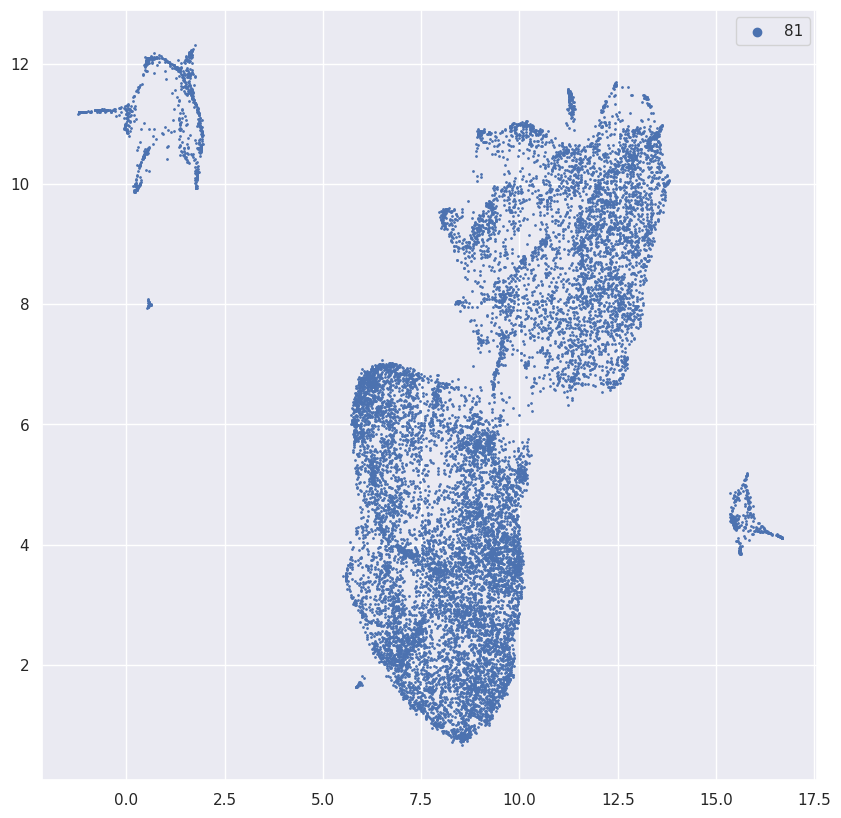

In [19]:
# Clusters:1,0
sns.set_theme(style='darkgrid')
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111)
for cluster_id in clusters_to_review:
    indexes = np.argwhere(labels==cluster_id)
    ax.scatter(u[indexes,0], u[indexes,1], label=cluster_id, s=1)
legend = ax.legend(frameon=True, markerscale=6)
plt.show()


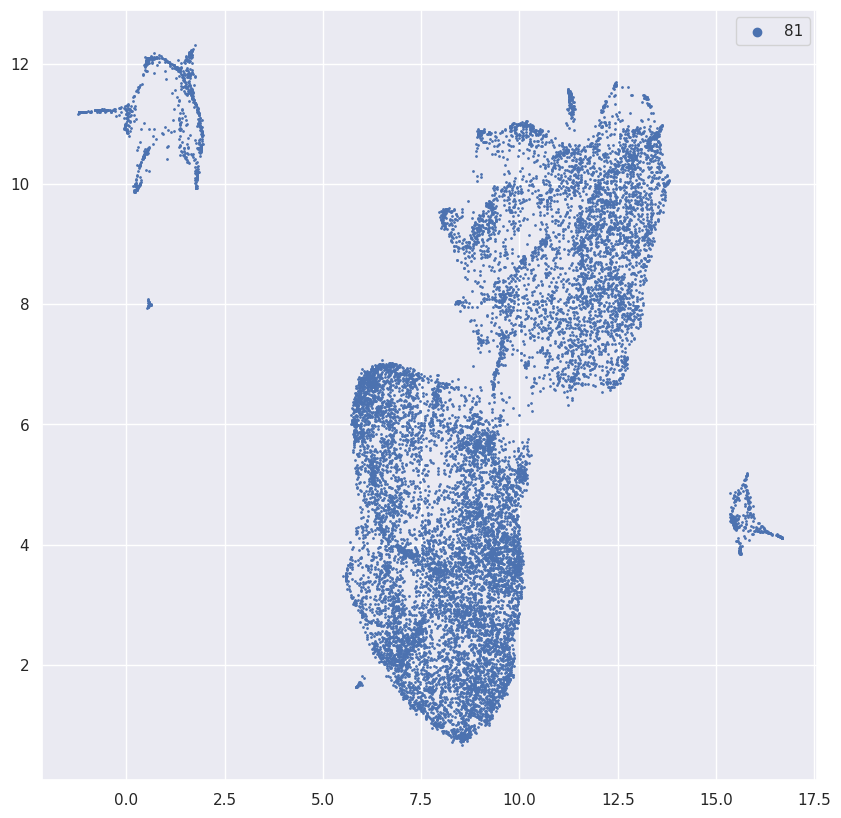

In [21]:
# Clusters:21,1
sns.set_theme(style='darkgrid')
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111)
for cluster_id in clusters_to_review:
    indexes = np.argwhere(labels==cluster_id)
    ax.scatter(u[indexes,0], u[indexes,1], label=cluster_id, s=1)
legend = ax.legend(frameon=True, markerscale=6)
plt.show()

Number of samples: 14954


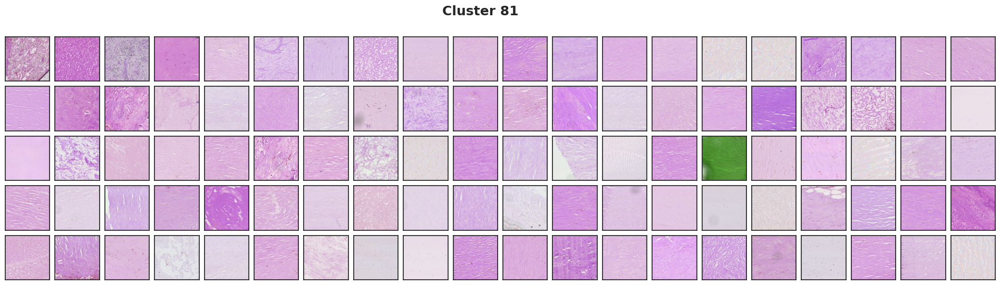

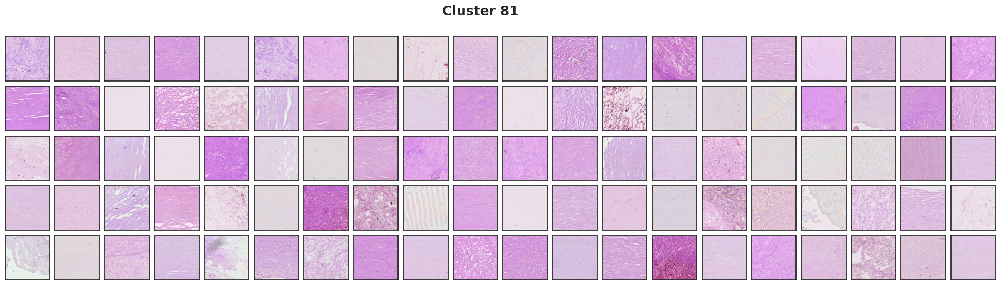

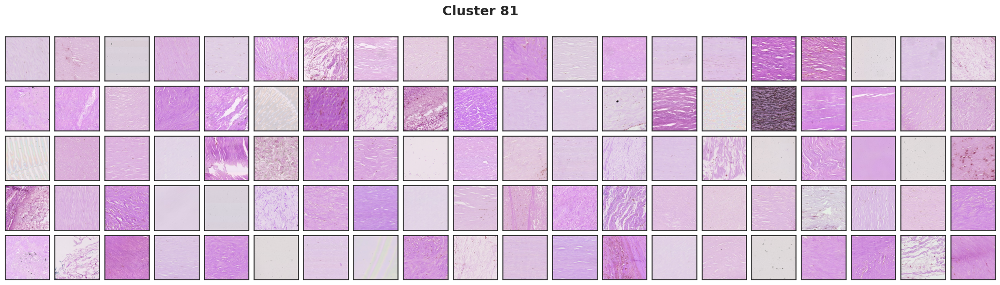

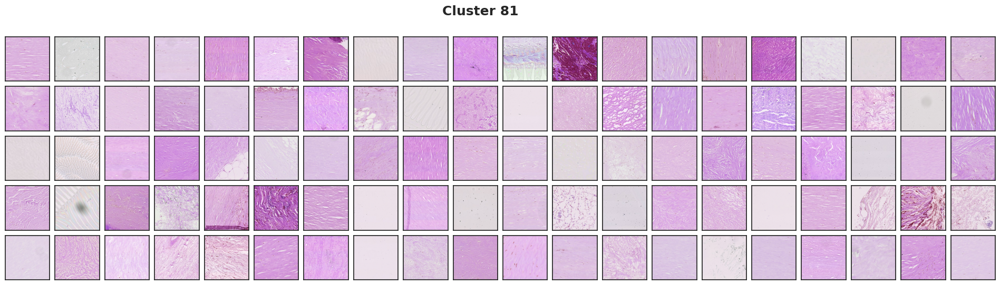

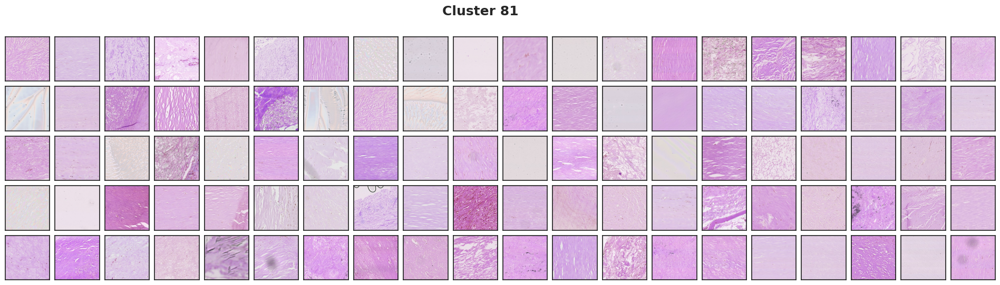

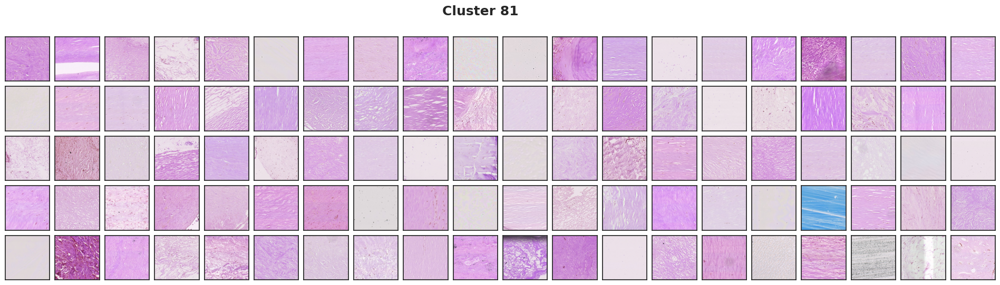

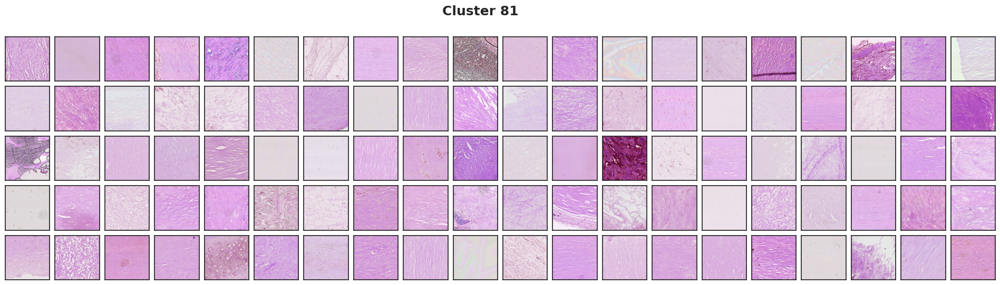

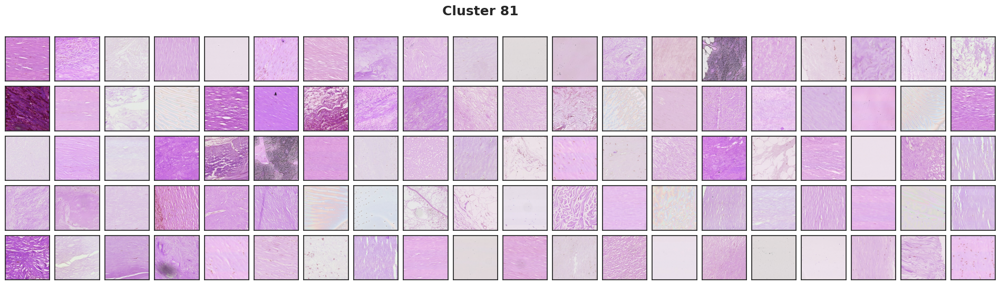

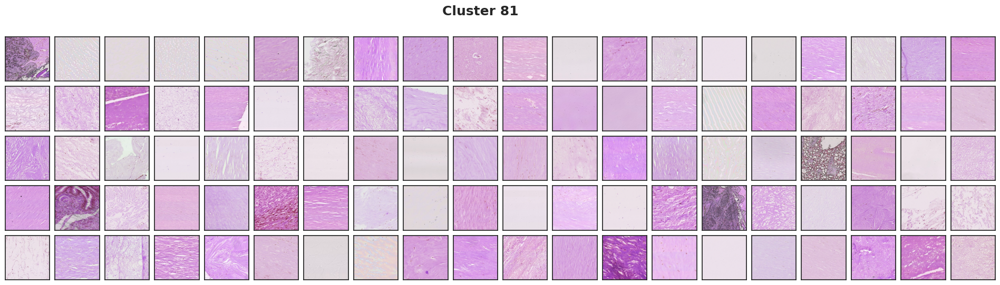

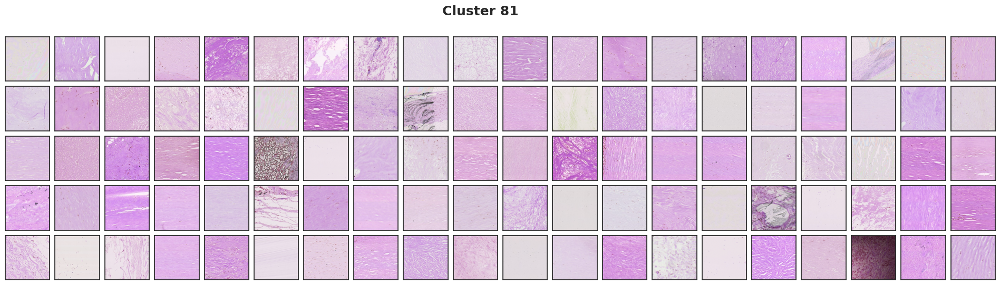

In [20]:
# Data Class with all h5, these contain the images.
data_dicts = dict()
data_dicts['train'] = data.training.images
data_dicts['valid'] = data.validation.images
data_dicts['test']  = data.test.images

def cluster_set_images(frame, data_dicts, cluster_id, groupby, batches=1):
    indexes       = frame[frame[groupby]==cluster_id]['indexes'].values.tolist()
    original_sets = frame[frame[groupby]==cluster_id]['original_set'].values.tolist()
    combined      = list(zip(indexes, original_sets))
    random.shuffle(combined)
    combined_plot = sorted(combined[:100*batches])

    for batch in range(batches):
        images_cluster = list()
        for index, original_set in combined_plot[100*batch:100*(batch+1)]:
            images_cluster.append(data_dicts[original_set][int(index)]/255.)

        sns.set_theme(style='white')
        fig = plt.figure(figsize=(30, 6))
        fig.suptitle('Cluster %s' % (cluster_id), fontsize=18, fontweight='bold')
        grid = ImageGrid(fig, 111, nrows_ncols=(5, 20), axes_pad=0.1,)

        for ax, im in zip(grid, images_cluster):
            ax.imshow(im)
            ax.set_xticks([])
            ax.set_yticks([])

        plt.show()
        sns.set_theme(style='darkgrid')

for cluster_id in clusters_to_review:
    print('Number of samples:', complete_merged[complete_merged[groupby]==cluster_id].shape[0])
    cluster_set_images(complete_merged, data_dicts, cluster_id, groupby, batches=10)
    print()
    print()
    print()

### Dump indexes to pickle

In [31]:
# agreed_clusters    = [97, 89, 21]
# clusters_to_remove = [104, 102, 99, 90, 86, 83, 73, 58] + agreed_clusters
# clusters_to_remove = [8,9,23,31,37,59,61,62,65,66,69,70,71,75,76,78,79,82,83,84,85,90,91,92]
clusters_to_remove = [4,15,23,26,27,34,48,51,54,56,65,66,68,73,75,78,81,84,85,88,90,91,92]

In [32]:
data_clusters = complete_merged[complete_merged[groupby].isin(clusters_to_remove)]
data_clusters

,0,1,2,3,4,5,6,7,8,9,...,os_event_data,os_event_ind,patterns,samples,slides,stage,tiles,type,complete_indexes,leiden_5.0
2,0.460753,-0.666300,2.044127,-1.514190,0.999817,-2.189361,-1.504777,0.842278,-1.494281,-1.537784,...,38.0,1.0,train,MESO_368_8,MESO_368_8,II,93_31.jpeg,Epithelioid,2,66
3,-0.182650,0.303449,0.045100,0.157699,-0.480825,-0.729627,0.519304,0.371911,-0.060095,0.051515,...,10.0,1.0,train,MESO_5_6,MESO_5_6,II,4_38.jpeg,Epithelioid,3,34
9,0.212383,0.338190,0.708602,1.460246,-1.014143,-1.225250,-1.006450,0.948992,-1.583220,-0.857248,...,38.0,1.0,train,MESO_368_8,MESO_368_8,II,46_35.jpeg,Epithelioid,9,4
11,-0.794475,0.791241,-1.758457,-0.031409,0.940948,1.336951,-0.714892,-0.586745,0.104989,-0.632994,...,25.0,1.0,train,MESO_372_5,MESO_372_5,IIIA,27_19.jpeg,Epithelioid,11,65
14,1.162105,-0.826834,-0.595106,0.363559,0.022036,-0.404911,0.414683,-0.753599,-0.222797,0.200803,...,13.0,1.0,train,MESO_51_5,MESO_51_5,Missing,7_4.jpeg,Epithelioid,14,23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2299986,-0.459984,0.778212,-0.343013,-0.169735,-0.099846,-0.424444,-0.176921,-0.056208,0.587628,0.688489,...,8.0,1.0,test,MESO_324_2,MESO_324_2,Missing,62_4.jpeg,Epithelioid,2299986,26
2299989,0.616959,-0.483671,-0.189938,-0.468489,-0.474895,-1.221729,0.966445,0.653012,-0.947111,-0.427145,...,7.0,0.0,test,MESO_353_4(2),MESO_353_4(2),IB,64_30.jpeg,Biphasic,2299989,56
2299993,-0.115124,0.598804,0.955927,-0.028927,-1.474983,0.580014,-0.087841,-0.558316,0.359797,-1.046936,...,7.0,1.0,test,MESO_484_11(2),MESO_484_11(2),IIIB,110_57.jpeg,Biphasic,2299993,51
2299994,0.534495,-0.558912,-1.169101,-1.079736,-1.216311,-1.421047,1.563505,1.355711,-0.723591,-0.921886,...,1.0,1.0,test,MESO_81_24,MESO_81_24,IB,9_0.jpeg,Epithelioid,2299994,92


In [33]:
# Indexes in the train/validation/test set split.
indexes_set = dict()
indexes_set['complete'] = data_clusters.complete_indexes.values.tolist()
for set_name in pd.unique(data_clusters['original_set'].values):
    indexes_set[set_name] = data_clusters[data_clusters['original_set']==set_name]['indexes'].astype(int).values.tolist()

for set_name in indexes_set:
    pickle_path = os.path.join(data_remove_path, '%s.pkl' % set_name)
    store_data(indexes_set[set_name], pickle_path)

### Additional dataset

In [34]:
if not additional_frame.shape[0] == additional_df.shape[0]:
    print('[Error] Expecting the same representations in the original H5 file and the cluster assignations.')
else:
    set_name = h5_additional_path.split('/hdf5_')[1].split('_he')[0]
    pickle_path = os.path.join(data_remove_path, '%s.pkl' % set_name)
    indexes_set = additional_df[additional_df[groupby].isin(clusters_to_remove)].index.astype(int).values.tolist()
    if len(indexes_set) > 0:
        store_data(indexes_set, pickle_path)



### Copy over the h5ad for reference, disk costly but necessary for backtracking

In [36]:

adata_name  = h5_complete_path.split('/hdf5_')[1].split('.h5')[0] + '_%s__fold%s_subsample' % (groupby.replace('.', 'p'), fold_number)
h5_path = os.path.join(adatas_path, adata_name) + '.h5ad'
shutil.copy2(h5_path, data_remove_path)

'/mnt/cephfs/sharedscratch/users/fshahi/Projects/Histomorphological-Phenotype-Learning/files/indexes_to_remove/Meso_400_subsampled/Meso_400_subsampled_he_complete_combined_metadata_leiden_5p0__fold4_subsample.h5ad'